# Importing required libs

In [5]:
import tensorflow as tf
import time
# Check TensorFlow version
print(f"TensorFlow version: {tf.__version__}")

# List available physical devices
physical_devices = tf.config.list_physical_devices('GPU')
print("Available GPUs:")
for device in physical_devices:
    print(device)
    
# Check if TensorFlow is using the GPU
if tf.test.is_built_with_cuda():
    print("TensorFlow is built with CUDA")
    if len(physical_devices) > 0:
        print("TensorFlow is using the GPU")
    else:
        print("TensorFlow is not using the GPU, but it is available")
else:
    print("TensorFlow is not built with CUDA")


TensorFlow version: 2.6.0
Available GPUs:
PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')
TensorFlow is built with CUDA
TensorFlow is using the GPU


In [6]:
%run generator.ipynb
%run model.ipynb

In [7]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Conv2DTranspose, concatenate
from tensorflow.keras.callbacks import ModelCheckpoint,Callback,LearningRateScheduler , TensorBoard
from tensorflow import keras
from tensorflow.keras.optimizers import SGD, RMSprop
from tensorflow.keras import backend as K
import os
import datetime
import numpy as np
import shutil
# from skimage import morphology, feature, segmentation, measure, io, color
# from skimage.filters import sobel
import matplotlib.pyplot as plt
import cv2
import pdb
import imageio
from scipy import misc
import scipy.ndimage as ndimage
import warnings
warnings.filterwarnings('ignore')
# from google.colab.patches import cv2_imshow  # Only required in Google Colab


# Visualization methods

In [8]:
def to_three_channels(img):
  return np.squeeze(np.stack((img,img,img), 2))

def show_sample(img, anno, label):
  squeezed =  np.squeeze(anno)

  figure, axis = plt.subplots(1,3)
  axis[0].imshow(img)
  axis[1].imshow(squeezed)
  squeezed =  np.squeeze(label)
  axis[2].imshow(squeezed)




def show_batch(img, label):
  show_sample(img[0,:,:,:],label[0,:,:,:])

In [9]:
import os
import numpy as np
import matplotlib.pyplot as plt

def save_sample(img, label , gt,  folder_name , sample_file_name, lable_type , counts):
    folder_name = folder_name + str(sample_file_name).split("dic.png")[0] + "/"
    if not os.path.exists(folder_name):
        os.makedirs(folder_name)
        print(folder_name)
        output_path = os.path.join(folder_name, 'counts.txt')
        with open(output_path, 'w') as file:
            file.write(str(counts) + '\n')
    
    
    squeezed_label =  np.squeeze(label)
    squeezed_gt =  np.squeeze(gt)
    

    # Ensure images are in the correct range
    if img.dtype == np.float64 or img.dtype == np.float32:
        img = np.interp(img, (img.min(), img.max()), (0, 1))
    
    if squeezed_label.dtype == np.float64 or squeezed_label.dtype == np.float32:
        squeezed_label = np.interp(squeezed_label, (squeezed_label.min(), squeezed_label.max()), (0, 1))
    if squeezed_gt.dtype == np.float64 or squeezed_gt.dtype == np.float32:
        squeezed_gt = np.interp(squeezed_gt, (squeezed_gt.min(), squeezed_gt.max()), (0, 1))
    

    # Save the first image
    fig, ax = plt.subplots()
    ax.imshow(img)
    # ax.set_title('Image')
    plt.axis('off')  # Turn off the axis
    output_path = os.path.join(folder_name, 'image_1.jpg')
    plt.savefig(output_path, bbox_inches='tight', pad_inches=0)  # Save without white spaces
    plt.close(fig)  # Close the figure to free up memory
    
    
    # Save the third image
    fig, ax = plt.subplots()
    ax.imshow(squeezed_label)
    # ax.set_title('Squeezed Label')
    plt.axis('off')  # Turn off the axis
    output_path = os.path.join(folder_name, 'image_pr_'+lable_type+'.jpg')
    plt.savefig(output_path, bbox_inches='tight', pad_inches=0)  # Save without white spaces
    plt.close(fig)  # Close the figure to free up memory

     # Save the third image
    fig, ax = plt.subplots()
    ax.imshow(squeezed_gt)
    # ax.set_title('Squeezed gt')
    plt.axis('off')  # Turn off the axis
    output_path = os.path.join(folder_name, 'image_gt_'+lable_type+'.jpg')
    plt.savefig(output_path, bbox_inches='tight', pad_inches=0)  # Save without white spaces
    plt.close(fig)  # Close the figure to free up memory
    # plt.show()


def show_save_all_sample(img , c_label , c_gt , r_label , r_gt , folder_name , sample_file_name , counts ):
    
    squeezed_r_label = np.squeeze(r_label)
    squeezed_c_label = np.squeeze(c_label)
    # Ensure images are in the correct range
    if img.dtype == np.float64 or img.dtype == np.float32:
        img = np.interp(img, (img.min(), img.max()), (0, 1))
   
    if squeezed_c_label.dtype == np.float64 or squeezed_c_label.dtype == np.float32:
        squeezed_c_label = np.interp(squeezed_c_label, (squeezed_c_label.min(), squeezed_c_label.max()), (0, 1))

    
    if squeezed_r_label.dtype == np.float64 or squeezed_c_label.dtype == np.float32:
        squeezed_r_label = np.interp(squeezed_r_label, (squeezed_r_label.min(), squeezed_r_label.max()), (0, 1))
        
   
    figure, axis = plt.subplots(1, 5, figsize=(15, 5))
    axis[0].imshow(img)
    axis[0].set_title('Image')
    axis[0].axis('off')
    
  
    axis[1].imshow(c_gt)
    axis[1].set_title('Centroids Ground Truth')
    axis[1].axis('off')
    
    axis[2].imshow(squeezed_c_label)
    axis[2].set_title('Centroids Prediction')
    axis[2].axis('off')

    
                 
    axis[3].imshow(r_gt)
    axis[3].set_title('Regions Ground Truth')
    axis[3].axis('off')
    
    axis[4].imshow(squeezed_r_label)
    axis[4].set_title('Regions Prediction')
    axis[4].axis('off')

    plt.show()
    save_sample(img, c_label ,c_gt, folder_name , sample_file_name, "centroids" , counts)
    save_sample(img, r_label ,r_gt, folder_name , sample_file_name, "regions" , counts )
    



# preparing the dataset

In [14]:
# Setting dimensions
image_height = 256
image_width = 256

## Generating DIC like images

In [18]:
base_address= 'C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper'

In [8]:
folder_path = base_address +'/synth_dataset/cells/'
output_folder_path = base_address+'/synth_dataset/dics/'

files = os.listdir(folder_path)

for file in files:
    # Create the full file path
    print(os.path.join(folder_path, file))
    if 'ipynb_checkpoints' not in os.path.join(folder_path, file) :

        file_path = os.path.join(folder_path, file)
        # Load the input image
        input_image = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)
    
        # Apply gradient filter to find edges of the cells
        gradient_x = cv2.Sobel(input_image, cv2.CV_64F, 1, 0, ksize=3)
        gradient_y = cv2.Sobel(input_image, cv2.CV_64F, 0, 1, ksize=3)
        gradient_magnitude = cv2.magnitude(gradient_x, gradient_y)
    
        # Normalize gradient magnitude to [0, 255]
        gradient_magnitude = cv2.normalize(gradient_magnitude, None, 0, 255, cv2.NORM_MINMAX)
    
        # Simulate shading
        shading_strength = 0.5 # Adjust this parameter to control shading strength
        shading = np.ones_like(input_image, dtype=np.float64) * 127
        shading += shading_strength * gradient_magnitude
    
        # Add shading to the input image
        output_image = cv2.add(input_image, shading.astype(np.uint8))
    
        new_file_name = file.replace('cell.png', '_dic.png')
    
        output_file_path = os.path.join(output_folder_path, new_file_name)
        print(output_file_path)
        cv2.imwrite(output_file_path, output_image)

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/cells/001cell.png
C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/dics/001_dic.png
C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/cells/002cell.png
C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/dics/002_dic.png
C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/cells/003cell.png
C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/dics/003_dic.png
C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/cells/004cell.png
C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/dics/004_dic.png
C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/cells/005cell.png
C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_

## Generating regions images

In [19]:
centroids_path = base_address+ '/synth_dataset/dots/'
regions_path =base_address+'/synth_dataset/regions/'

data = []
anno = []
img_labels=[]
def show_maped_centroids(centroids_path):
  imList = os.listdir(centroids_path)
  for i in range(len(imList)):
          # read the original image
          binary_image = cv2.imread( os.path.join(centroids_path, imList[i]) , cv2.IMREAD_GRAYSCALE)
          print(binary_image.shape)
          black_image = np.zeros((image_height, image_width, 1), dtype=np.uint8)

          white_pixel_locations = np.where(binary_image >0)

          for y, x in zip(*white_pixel_locations):
              cv2.circle(black_image, (x, y), 7 , 255, -1)  # Draw a red circle at each white pixel location
              cv2.circle(binary_image, (x, y), 7 , 255, -1)  # Draw a red circle at each white pixel location

          # Show the result image
          # cv2_imshow(black_image)
          # cv2_imshow(binary_image)
          cv2.imwrite( str(regions_path+ str( imList[i][:3] )+ 'regions.png')  , black_image )

          print(str(os.path.join(centroids_path, imList[i][:3])) , "\n\n\n"  )
show_maped_centroids(centroids_path)

(256, 256)
C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/dots/001 



(256, 256)
C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/dots/002 



(256, 256)
C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/dots/003 



(256, 256)
C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/dots/004 



(256, 256)
C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/dots/005 



(256, 256)
C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/dots/006 



(256, 256)
C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/dots/007 



(256, 256)
C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/dots/008 



(256, 256)
C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/dots/009 



(256, 256)
C:/Users

# Light-U-Net Centroids

In [20]:
def step_decay(epoch):
    step = 16
    lrate=1e0
    num =  epoch // step
    if num % 3 == 0:
        lrate = 1e-3
    elif num % 3 == 1:
        lrate = 1e-4
    else:
        lrate = 1e-5
        #lrate = initial_lrate * 1/(1 + decay * (epoch - num * step))
    print('Learning rate for epoch {} is {}.'.format(epoch+1, lrate))
    return float(lrate)

class LossHistory(Callback):
    def on_train_begin(self, logs={}):
        self.losses = []

    def on_batch_end(self, batch, logs={}):
        self.losses.append(logs.get('loss'))

tf.config.run_functions_eagerly(True)
np.float = float

def train_(data, anno):
    # # data, anno = read_data(base_path)
    # data, anno = load_images_from_folder(input_image_folder , label_center_folder , "region")
    # print(f'Loaded {len(data)} cell images and  {len(anno)} regions label images.')

    file_name=  datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
    # anno = np.expand_dims(anno, axis = 1)

    mean = np.mean(data)
    std = np.std(data)

    data_ = (data - mean) / std
    Length = int(len(data)*0.85)
    print("train set size : ",Length , " test set size : " , len(data) - Length)

    train_data = data_[:Length, :]
    train_anno = anno[:Length, :]
    val_data = data_[Length:, :]
    val_anno = anno[Length:, :]

    print('-'*30)
    print('Creating and compiling the fully convolutional regression networks.')
    print('-'*30)

    model = buildModel_Light_U_net(input_dim = (256,256,3))
    model_checkpoint = ModelCheckpoint(base_address+'/checkpoints/Light_U_Net_center_synth_dataset'+file_name+'.hdf5', monitor='loss', save_best_only=True)
    model.summary()
    print('...Fitting model...')
    print('-'*30)
    change_lr = LearningRateScheduler(step_decay)

    datagen = ImageDataGenerator(
        featurewise_center = False,  # set input mean to 0 over the dataset
        samplewise_center = False,  # set each sample mean to 0
        featurewise_std_normalization = False,  # divide inputs by std of the dataset
        samplewise_std_normalization = False,  # divide each input by its std
        zca_whitening = False,  # apply ZCA whitening
        rotation_range = 30,  # randomly rotate images in the range (degrees, 0 to 180)
        width_shift_range = 0.3,  # randomly shift images horizontally (fraction of total width)
        height_shift_range = 0.3,  # randomly shift images vertically (fraction of total height)
        zoom_range = 0.3,
        shear_range = 0.,
        horizontal_flip = True,  # randomly flip images
        vertical_flip = True, # randomly flip images
        fill_mode = 'constant',
        dim_ordering = 'tf')

    # Fit the model on the batches generated by datagen.flow().
    history = model.fit_generator(datagen.flow(train_data,
                                      train_anno,
                                      batch_size = 16
                                      ),
                        steps_per_epoch = train_data.shape[0],
                        epochs = 50,
                        #epochs = 192,
                        callbacks = [model_checkpoint, change_lr],
                        )
    return history , model, val_data, val_anno
    """ model.load_weights('cell_counting.hdf5')
    A = model.predict(val_data)
    mean_diff = np.average(np.abs(np.sum(np.sum(A,1),1)-np.sum(np.sum(val_anno,1),1))) / (100.0)
    print('After training, the difference is : {} cells per image.'.format(np.abs(mean_diff))) """


    


# Centroids

In [21]:
input_image_folder= base_address+ '/synth_dataset/dics/'

label_center_folder= base_address+ '/synth_dataset/dots/'

In [22]:

def load_images_from_folder(input_image_folder , label_image_folder , type_of_label , factor= 100):
    images = []
    labels = []
    dots_count=[]
    file_names=[]
    for filename in os.listdir(input_image_folder):
        img_path = os.path.join(input_image_folder, filename)
        label_path = os.path.join(label_image_folder, filename[:-8] + 'dots.png')

        # print("input", img_path)
        # print("lable", label_path)
        file_names.append(filename)
        img = cv2.imread(img_path)  # Read as grayscale
        label_image = cv2.imread( label_path )
        # plt.imshow(label_image)
        # plt.axis('off')  # Turn off axis numbers and ticks
        # plt.show()        
        label_image1= label_image
        if type_of_label== 'center':
          label_image= factor * (label_image[:,:,2] > 0)
        label_image = np.expand_dims(label_image, axis=-1)
        # print(label_image.shape)  # Output: (256, 256, 1)
        # print(np.unique(label_image))
        dots_count.append(str(np.sum(label_image1[:,:,2] > 0)))

        if img is not None and label_image is not None :
            # print(img.shape , np.unique(label_image) )
            images.append(img)
            labels.append(label_image)
    return np.array(images), np.array(labels) , np.array(dots_count) , np.array(file_names)

In [23]:
data, anno_centroids , counts , centroids_file_names = load_images_from_folder(input_image_folder , label_center_folder , "center")
print(f'Loaded {len(data)} cell images and  {len(anno_centroids)} regions label images.')

Loaded 32 cell images and  32 regions label images.


## train

In [24]:
history_center , model_center, val_data_center, val_anno_center = train_(data, anno_centroids)

train set size :  27  test set size :  5
------------------------------
Creating and compiling the fully convolutional regression networks.
------------------------------
Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 256, 256, 64) 1728        input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 256, 256, 64) 256         conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation

## loss chart

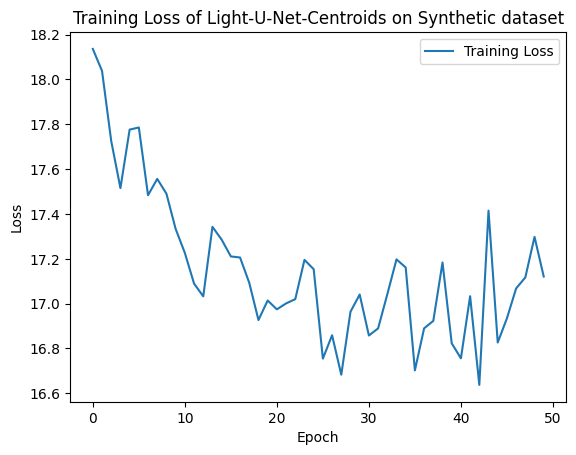

In [25]:
import matplotlib.pyplot as plt

plt.plot(history_center.history['loss'], label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss of Light-U-Net-Centroids on Synthetic dataset')
plt.legend()
plt.show()

# Light-U-Net Regions

In [26]:
def step_decay(epoch):
    step = 16
    lrate=1e0
    num =  epoch // step
    if num % 3 == 0:
        lrate = 1e-3
    elif num % 3 == 1:
        lrate = 1e-4
    else:
        lrate = 1e-5
        #lrate = initial_lrate * 1/(1 + decay * (epoch - num * step))
    print('Learning rate for epoch {} is {}.'.format(epoch+1, lrate))
    return float(lrate)

class LossHistory(Callback):
    def on_train_begin(self, logs={}):
        self.losses = []

    def on_batch_end(self, batch, logs={}):
        self.losses.append(logs.get('loss'))

tf.config.run_functions_eagerly(True)
np.float = float

def train_(data, anno):
    # # data, anno = read_data(base_path)
    # data, anno = load_images_from_folder(input_image_folder , label_center_folder , "region")
    # print(f'Loaded {len(data)} cell images and  {len(anno)} regions label images.')

    file_name=  datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
    # anno = np.expand_dims(anno, axis = 1)

    mean = np.mean(data)
    std = np.std(data)

    data_ = (data - mean) / std
    Length = int(len(data)*0.85)
    print("train set size : ",Length , " test set size : " , len(data) - Length)

    train_data = data_[:Length, :]
    train_anno = anno[:Length, :]
    val_data = data_[Length:, :]
    val_anno = anno[Length:, :]

    print('-'*30)
    print('Creating and compiling the fully convolutional regression networks.')
    print('-'*30)

    model = buildModel_Light_U_net(input_dim = (256,256,3))
    model_checkpoint = ModelCheckpoint(base_address+'/checkpoints/Light_U_Net_regions_synth_dataset'+file_name+'.hdf5', monitor='loss', save_best_only=True)
    model.summary()
    print('...Fitting model...')
    print('-'*30)
    change_lr = LearningRateScheduler(step_decay)

    datagen = ImageDataGenerator(
        featurewise_center = False,  # set input mean to 0 over the dataset
        samplewise_center = False,  # set each sample mean to 0
        featurewise_std_normalization = False,  # divide inputs by std of the dataset
        samplewise_std_normalization = False,  # divide each input by its std
        zca_whitening = False,  # apply ZCA whitening
        rotation_range = 30,  # randomly rotate images in the range (degrees, 0 to 180)
        width_shift_range = 0.3,  # randomly shift images horizontally (fraction of total width)
        height_shift_range = 0.3,  # randomly shift images vertically (fraction of total height)
        zoom_range = 0.3,
        shear_range = 0.,
        horizontal_flip = True,  # randomly flip images
        vertical_flip = True, # randomly flip images
        fill_mode = 'constant',
        dim_ordering = 'tf')

    # Fit the model on the batches generated by datagen.flow().
    history = model.fit_generator(datagen.flow(train_data,
                                      train_anno,
                                      batch_size = 16
                                      ),
                        steps_per_epoch = train_data.shape[0],
                        epochs = 50,
                        #epochs = 192,
                        callbacks = [model_checkpoint, change_lr],
                        )
    return history , model, val_data, val_anno
    """ model.load_weights('cell_counting.hdf5')
    A = model.predict(val_data)
    mean_diff = np.average(np.abs(np.sum(np.sum(A,1),1)-np.sum(np.sum(val_anno,1),1))) / (100.0)
    print('After training, the difference is : {} cells per image.'.format(np.abs(mean_diff))) """


    


# Regions

In [27]:

def load_images_from_folder(input_image_folder , label_image_folder , type_of_label , factor= 100):
    images = []
    labels = []
    file_names=[]
    for filename in os.listdir(input_image_folder):

        img_path = os.path.join(input_image_folder, filename)
        label_path = os.path.join(label_image_folder, filename[:-8] + 'regions.png')
        # print(img_path)
        # print(label_path)
        img = cv2.imread(img_path)  # Read as grayscale
        label_image = cv2.imread( label_path )
        # plt.imshow(label_image)
        # plt.axis('off')  # Turn off axis numbers and ticks
        # plt.show()
        if type_of_label== 'center':
          label_image= factor * (label_image[:,:,2] > 0)
        
        label_image = label_image[:,:,0]
        label_image = np.expand_dims(label_image, axis=-1)
        # print(label_image.shape)  # Output: (256, 256, 1)
        # print(np.unique(label_image))

        if img is not None and label_image is not None :
            # print(img.shape )
            # print(img.shape , label_image)
            images.append(img)
            labels.append(label_image)
            file_names.append(filename)

    return np.array(images), np.array(labels) , np.array(file_names)


In [28]:
input_image_folder=base_address+ '/synth_dataset/dics/'

label_region_folder=base_address+ '/synth_dataset/regions/'

In [29]:
data, anno_regions  ,region_file_names = load_images_from_folder(input_image_folder , label_region_folder , "region")
print(f'Loaded {len(data)} cell images and  {len(anno_regions)} regions label images.')


Loaded 32 cell images and  32 regions label images.


## train

In [30]:
history_regions , model_regions, val_data_regions, val_anno_regions = train_(data, anno_regions)

train set size :  27  test set size :  5
------------------------------
Creating and compiling the fully convolutional regression networks.
------------------------------
Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d_13 (Conv2D)              (None, 256, 256, 64) 1728        input_2[0][0]                    
__________________________________________________________________________________________________
batch_normalization_13 (BatchNo (None, 256, 256, 64) 256         conv2d_13[0][0]                  
__________________________________________________________________________________________________
activation_13 (Activ

## loss chart

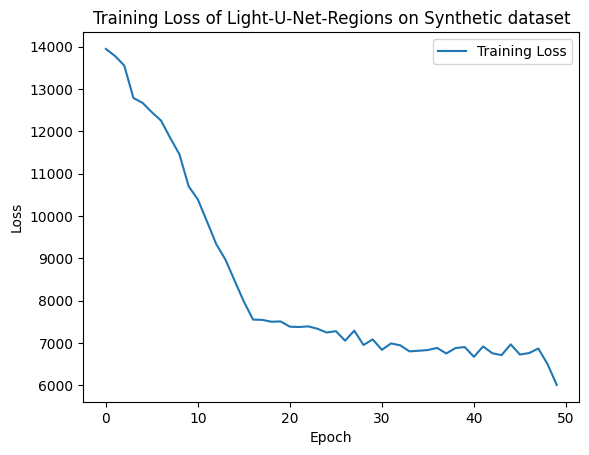

In [31]:
import matplotlib.pyplot as plt

plt.plot(history_regions.history['loss'], label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss of Light-U-Net-Regions on Synthetic dataset')
plt.legend()
plt.show()

#  visualize network outputs

In [32]:
mean = np.mean(data)
std = np.std(data)

data_ = (data - mean) / std
Length = int(len(data)*0.85)
print("train set size : ",Length , " test set size : " , len(data) - Length)

# train_data_center = data_[:Length, :]
# train_anno_center = anno[:Length, :]
# val_data_center = data_[Length:, :]
# val_anno_center = anno[Length:, :]

train set size :  27  test set size :  5


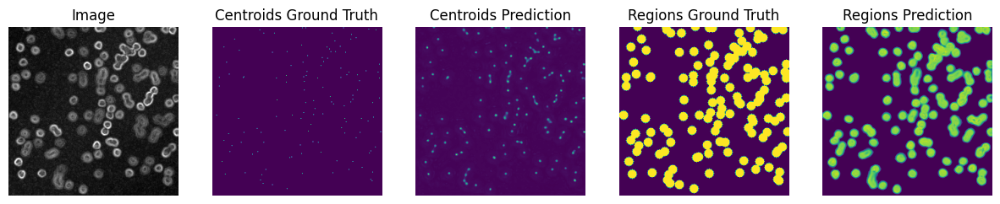

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_light_u_net/001_/
sample  0  saved


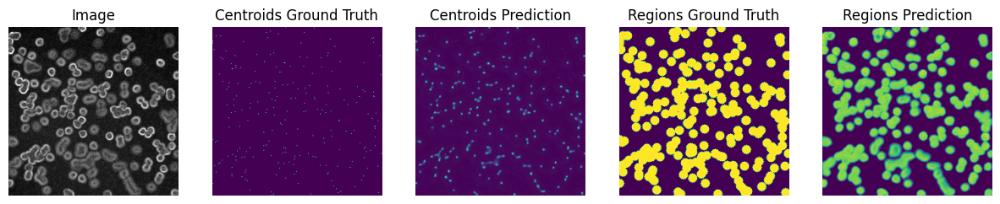

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_light_u_net/002_/
sample  1  saved


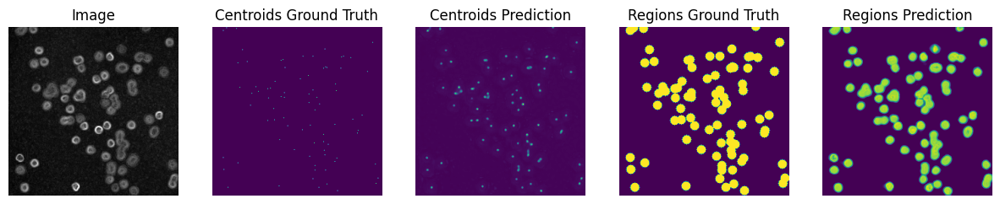

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_light_u_net/003_/
sample  2  saved


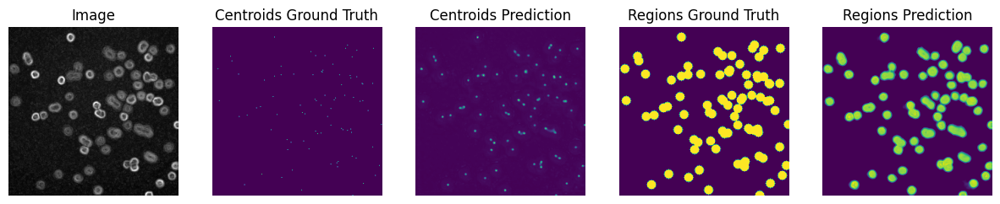

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_light_u_net/004_/
sample  3  saved


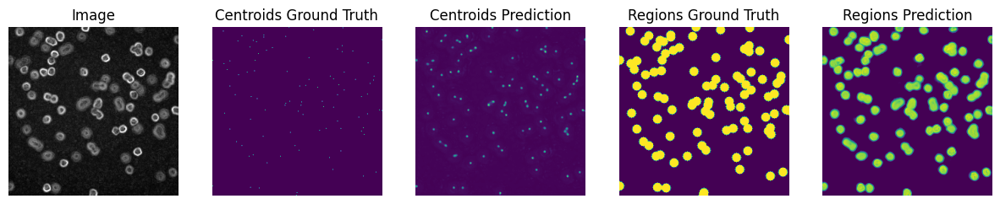

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_light_u_net/005_/
sample  4  saved


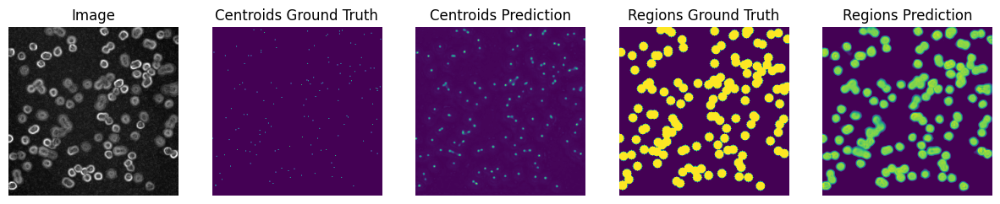

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_light_u_net/006_/
sample  5  saved


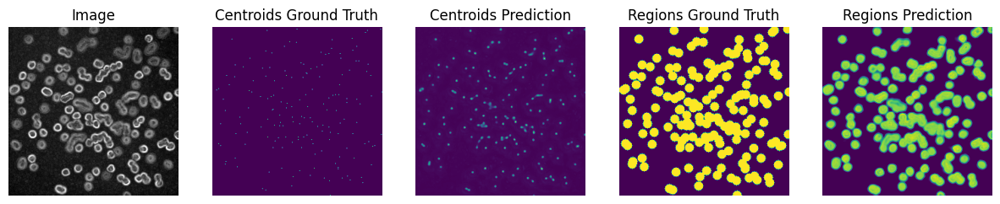

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_light_u_net/007_/
sample  6  saved


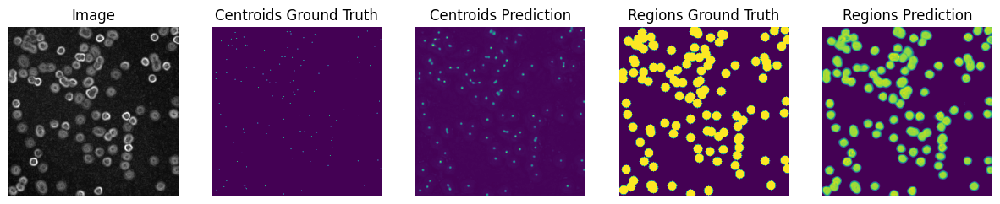

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_light_u_net/008_/
sample  7  saved


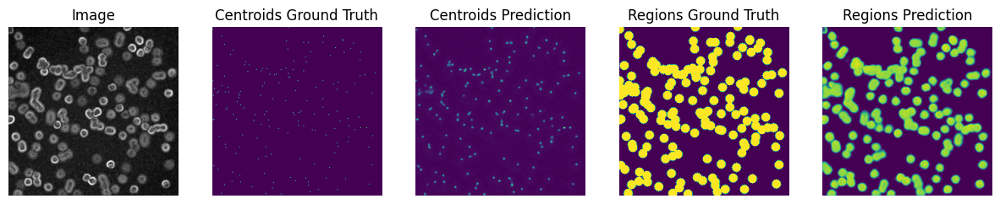

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_light_u_net/009_/
sample  8  saved


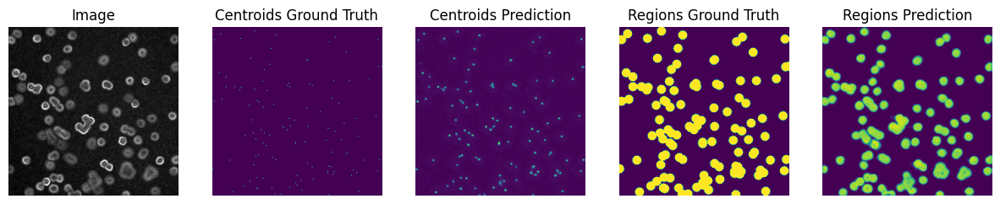

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_light_u_net/010_/
sample  9  saved


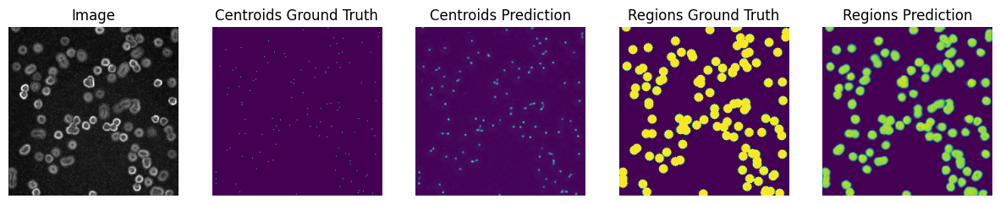

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_light_u_net/011_/
sample  10  saved


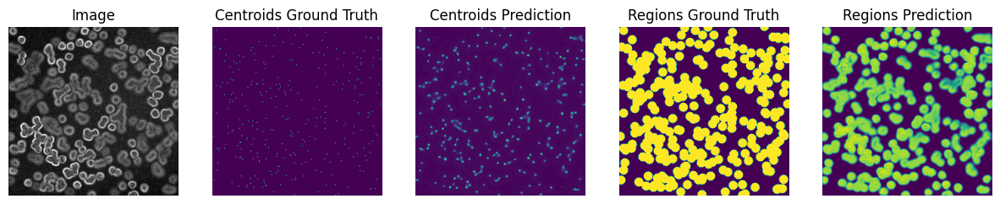

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_light_u_net/012_/
sample  11  saved


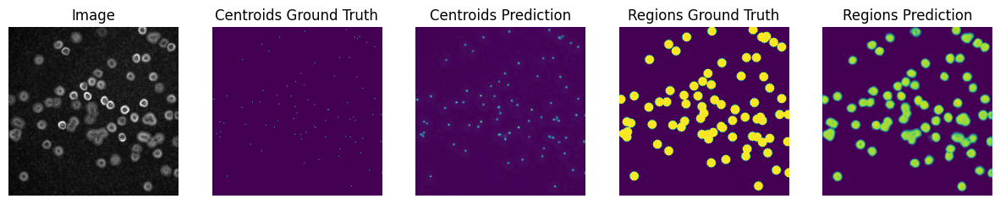

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_light_u_net/013_/
sample  12  saved


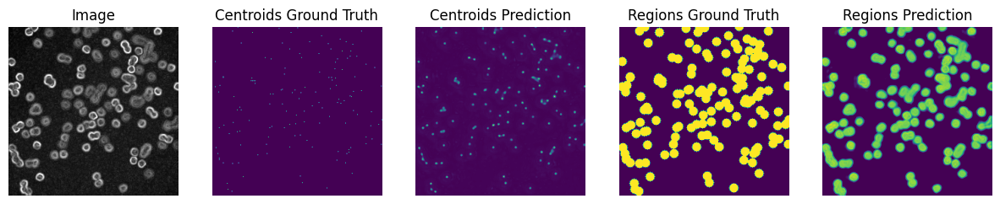

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_light_u_net/014_/
sample  13  saved


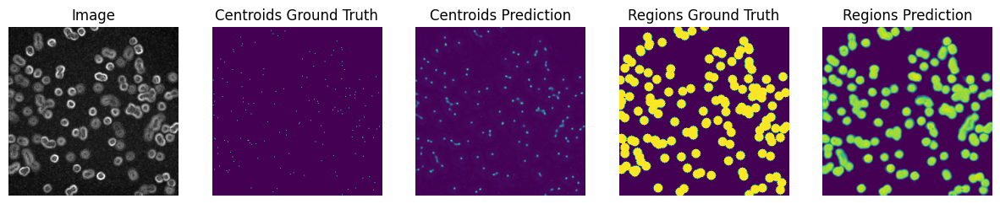

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_light_u_net/015_/
sample  14  saved


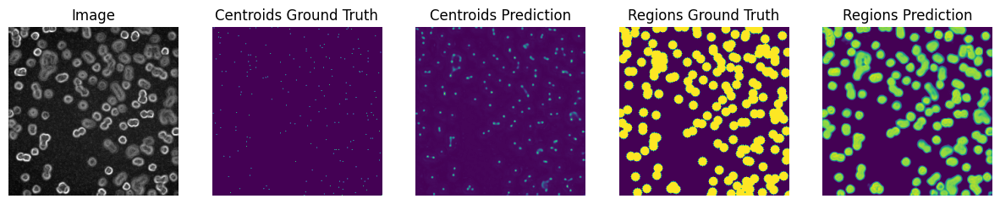

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_light_u_net/016_/
sample  15  saved


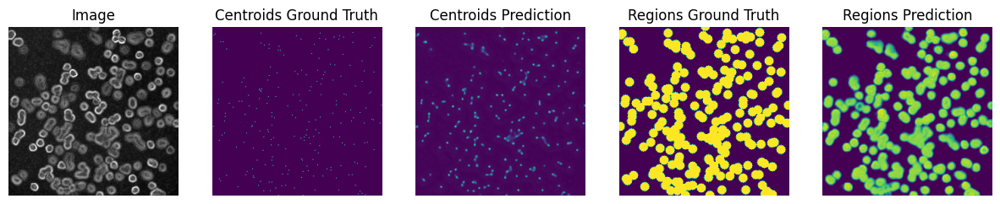

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_light_u_net/017_/
sample  16  saved


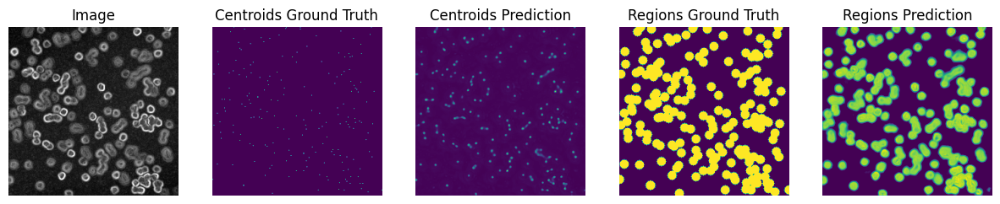

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_light_u_net/018_/
sample  17  saved


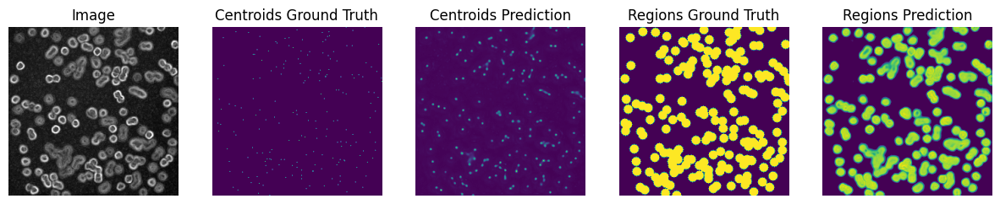

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_light_u_net/019_/
sample  18  saved


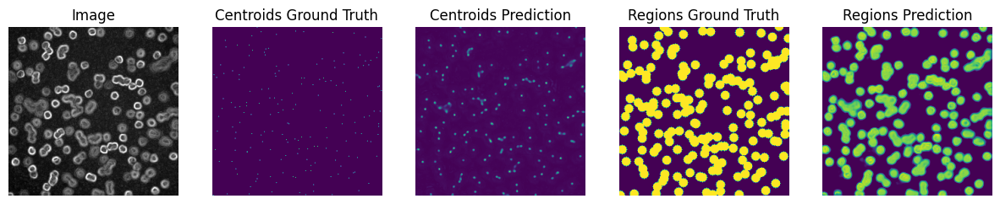

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_light_u_net/020_/
sample  19  saved


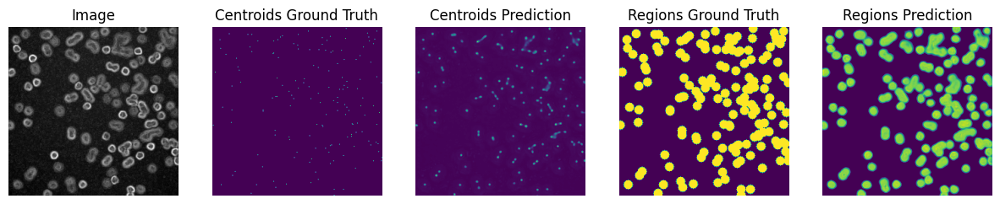

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_light_u_net/021_/
sample  20  saved


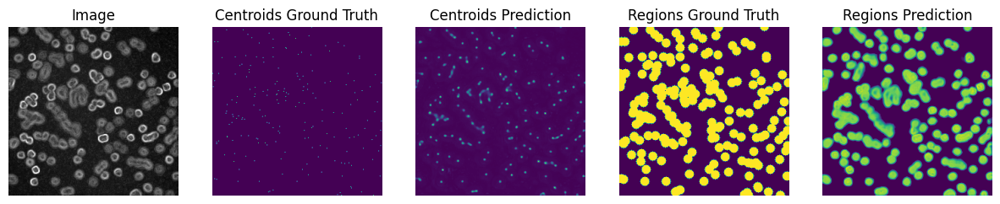

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_light_u_net/022_/
sample  21  saved


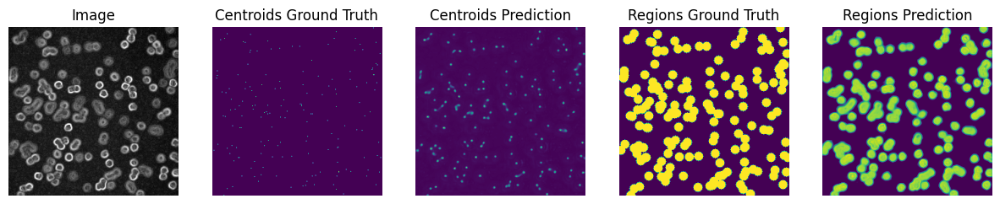

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_light_u_net/023_/
sample  22  saved


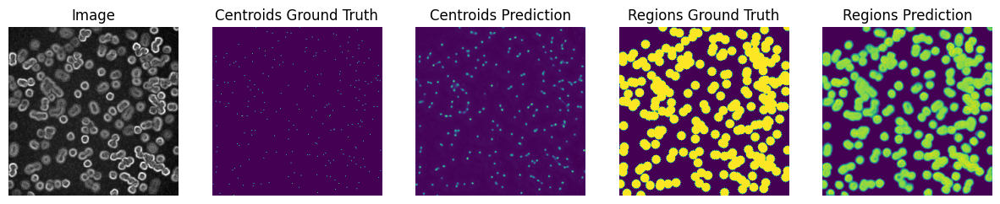

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_light_u_net/024_/
sample  23  saved


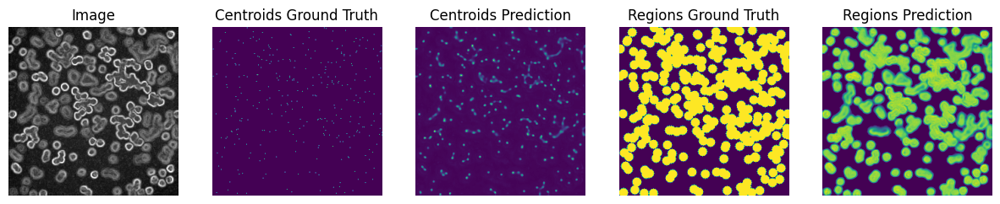

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_light_u_net/025_/
sample  24  saved


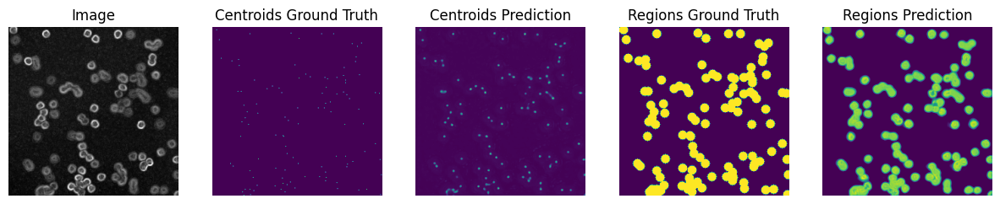

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_light_u_net/026_/
sample  25  saved


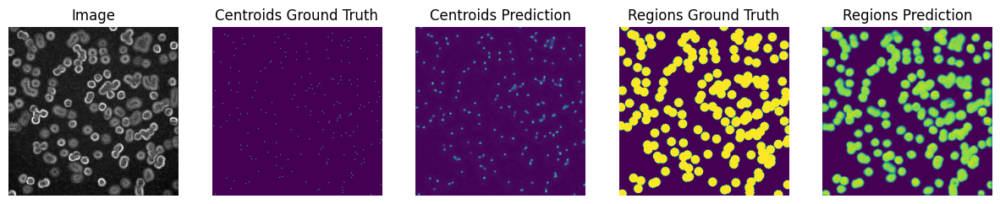

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_light_u_net/027_/
sample  26  saved


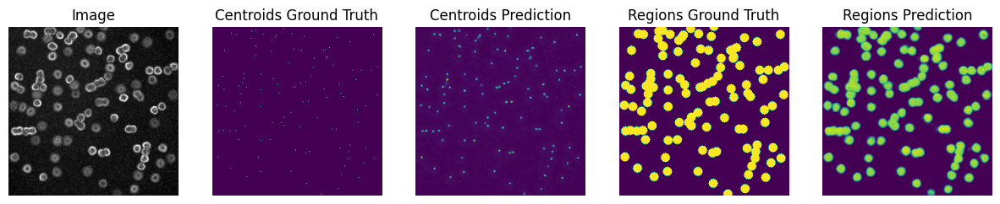

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_light_u_net/028_/
sample  27  saved


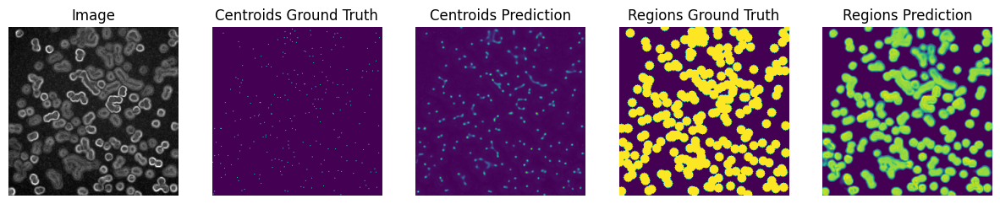

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_light_u_net/029_/
sample  28  saved


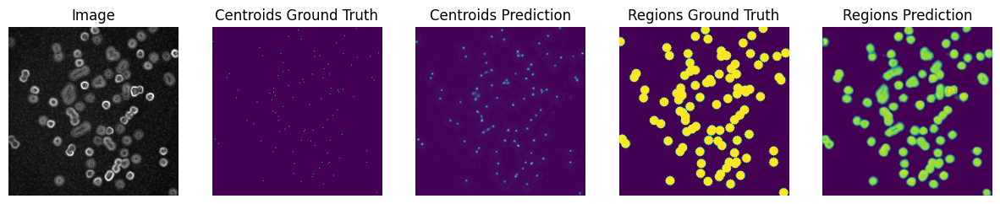

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_light_u_net/030_/
sample  29  saved


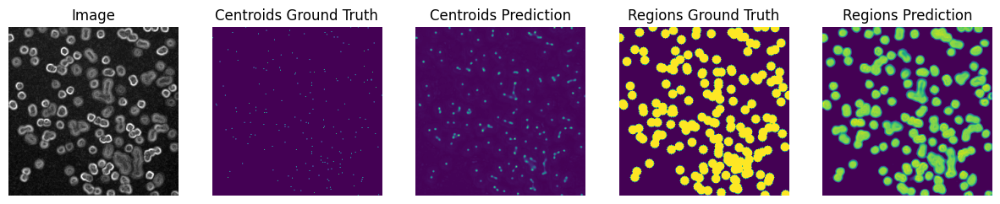

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_light_u_net/031_/
sample  30  saved


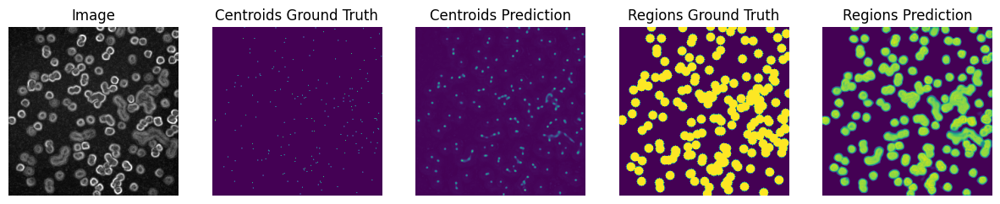

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_light_u_net/032_/
sample  31  saved


In [33]:
# model_regions = buildModel_U_net(input_dim = (256,256,3))
# model_center = buildModel_U_net(input_dim = (256,256,3))
# model_regions.load_weights('./checkpoints_yeast/own_net_regions_50.hdf5')
# model_center.load_weights('./checkpoints_yeast/own_net_center.hdf5')

A = model_regions.predict(data_)

B = model_center.predict(data_)



# data_r_anno_reshaped = np.transpose(r_anno, (0, 2, 3, 1))
# print(data_.shape , r_anno.shape , data_r_anno_reshaped.shape ,  A.shape)

folder_name= base_address+ '/synth_dataset/outputs_light_u_net/'
for i in range(data_.shape[0]):
    show_save_all_sample(data_[i] , B[i], anno_centroids[i] , A[i],anno_regions[i]  , folder_name , region_file_names[i] ,counts[i] )
    print("sample ", i , " saved")

# U-Net

## U-Net Centroids

In [36]:
def step_decay(epoch):
    step = 16
    lrate=1e0
    num =  epoch // step
    if num % 3 == 0:
        lrate = 1e-3
    elif num % 3 == 1:
        lrate = 1e-4
    else:
        lrate = 1e-5
        #lrate = initial_lrate * 1/(1 + decay * (epoch - num * step))
    print('Learning rate for epoch {} is {}.'.format(epoch+1, lrate))
    return float(lrate)

class LossHistory(Callback):
    def on_train_begin(self, logs={}):
        self.losses = []

    def on_batch_end(self, batch, logs={}):
        self.losses.append(logs.get('loss'))

tf.config.run_functions_eagerly(True)
np.float = float

def train_(data, anno):
    # # data, anno = read_data(base_path)
    # data, anno = load_images_from_folder(input_image_folder , label_center_folder , "region")
    # print(f'Loaded {len(data)} cell images and  {len(anno)} regions label images.')

    file_name=  datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
    # anno = np.expand_dims(anno, axis = 1)

    mean = np.mean(data)
    std = np.std(data)

    data_ = (data - mean) / std
    Length = int(len(data)*0.85)
    print("train set size : ",Length , " test set size : " , len(data) - Length)

    train_data = data_[:Length, :]
    train_anno = anno[:Length, :]
    val_data = data_[Length:, :]
    val_anno = anno[Length:, :]

    print('-'*30)
    print('Creating and compiling the fully convolutional regression networks.')
    print('-'*30)

    model = build_unet_model(input_dim = (256,256,3))
    model_checkpoint = ModelCheckpoint(base_address+'/checkpoints/U_Net_center_synth_dataset'+file_name+'.hdf5', monitor='loss', save_best_only=True)
    model.summary()
    print('...Fitting model...')
    print('-'*30)
    change_lr = LearningRateScheduler(step_decay)

    datagen = ImageDataGenerator(
        featurewise_center = False,  # set input mean to 0 over the dataset
        samplewise_center = False,  # set each sample mean to 0
        featurewise_std_normalization = False,  # divide inputs by std of the dataset
        samplewise_std_normalization = False,  # divide each input by its std
        zca_whitening = False,  # apply ZCA whitening
        rotation_range = 30,  # randomly rotate images in the range (degrees, 0 to 180)
        width_shift_range = 0.3,  # randomly shift images horizontally (fraction of total width)
        height_shift_range = 0.3,  # randomly shift images vertically (fraction of total height)
        zoom_range = 0.3,
        shear_range = 0.,
        horizontal_flip = True,  # randomly flip images
        vertical_flip = True, # randomly flip images
        fill_mode = 'constant',
        dim_ordering = 'tf')

    # Fit the model on the batches generated by datagen.flow().
    history = model.fit_generator(datagen.flow(train_data,
                                      train_anno,
                                      batch_size = 16
                                      ),
                        steps_per_epoch = train_data.shape[0],
                        epochs = 50,
                        #epochs = 192,
                        callbacks = [model_checkpoint, change_lr],
                        )
    return history , model, val_data, val_anno
    """ model.load_weights('cell_counting.hdf5')
    A = model.predict(val_data)
    mean_diff = np.average(np.abs(np.sum(np.sum(A,1),1)-np.sum(np.sum(val_anno,1),1))) / (100.0)
    print('After training, the difference is : {} cells per image.'.format(np.abs(mean_diff))) """


    


In [41]:
history_center , model_center, val_data_center, val_anno_center = train_(data, anno_centroids)

train set size :  27  test set size :  5
------------------------------
Creating and compiling the fully convolutional regression networks.
------------------------------
Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d_44 (Conv2D)              (None, 256, 256, 64) 1792        input_4[0][0]                    
__________________________________________________________________________________________________
batch_normalization_42 (BatchNo (None, 256, 256, 64) 256         conv2d_44[0][0]                  
__________________________________________________________________________________________________
conv2d_45 (Conv2D)  

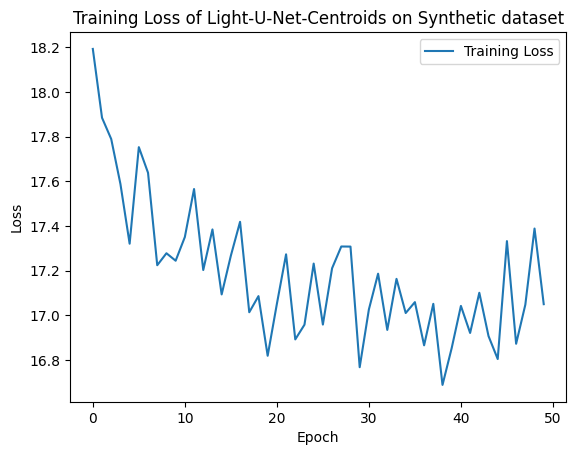

In [42]:
import matplotlib.pyplot as plt

plt.plot(history_center.history['loss'], label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss of Light-U-Net-Centroids on Synthetic dataset')
plt.legend()
plt.show()

# U-Net Regions

In [43]:
def step_decay(epoch):
    step = 16
    lrate=1e0
    num =  epoch // step
    if num % 3 == 0:
        lrate = 1e-3
    elif num % 3 == 1:
        lrate = 1e-4
    else:
        lrate = 1e-5
        #lrate = initial_lrate * 1/(1 + decay * (epoch - num * step))
    print('Learning rate for epoch {} is {}.'.format(epoch+1, lrate))
    return float(lrate)

class LossHistory(Callback):
    def on_train_begin(self, logs={}):
        self.losses = []

    def on_batch_end(self, batch, logs={}):
        self.losses.append(logs.get('loss'))

tf.config.run_functions_eagerly(True)
np.float = float

def train_(data, anno):
    # # data, anno = read_data(base_path)
    # data, anno = load_images_from_folder(input_image_folder , label_center_folder , "region")
    # print(f'Loaded {len(data)} cell images and  {len(anno)} regions label images.')

    file_name=  datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
    # anno = np.expand_dims(anno, axis = 1)

    mean = np.mean(data)
    std = np.std(data)

    data_ = (data - mean) / std
    Length = int(len(data)*0.85)
    print("train set size : ",Length , " test set size : " , len(data) - Length)

    train_data = data_[:Length, :]
    train_anno = anno[:Length, :]
    val_data = data_[Length:, :]
    val_anno = anno[Length:, :]

    print('-'*30)
    print('Creating and compiling the fully convolutional regression networks.')
    print('-'*30)

    model = build_unet_model(input_dim = (256,256,3))
    model_checkpoint = ModelCheckpoint(base_address+'/checkpoints/U_Net_regions_synth_dataset'+file_name+'.hdf5', monitor='loss', save_best_only=True)
    model.summary()
    print('...Fitting model...')
    print('-'*30)
    change_lr = LearningRateScheduler(step_decay)

    datagen = ImageDataGenerator(
        featurewise_center = False,  # set input mean to 0 over the dataset
        samplewise_center = False,  # set each sample mean to 0
        featurewise_std_normalization = False,  # divide inputs by std of the dataset
        samplewise_std_normalization = False,  # divide each input by its std
        zca_whitening = False,  # apply ZCA whitening
        rotation_range = 30,  # randomly rotate images in the range (degrees, 0 to 180)
        width_shift_range = 0.3,  # randomly shift images horizontally (fraction of total width)
        height_shift_range = 0.3,  # randomly shift images vertically (fraction of total height)
        zoom_range = 0.3,
        shear_range = 0.,
        horizontal_flip = True,  # randomly flip images
        vertical_flip = True, # randomly flip images
        fill_mode = 'constant',
        dim_ordering = 'tf')

    # Fit the model on the batches generated by datagen.flow().
    history = model.fit_generator(datagen.flow(train_data,
                                      train_anno,
                                      batch_size = 16
                                      ),
                        steps_per_epoch = train_data.shape[0],
                        epochs = 50,
                        #epochs = 192,
                        callbacks = [model_checkpoint, change_lr],
                        )
    return history , model, val_data, val_anno
    """ model.load_weights('cell_counting.hdf5')
    A = model.predict(val_data)
    mean_diff = np.average(np.abs(np.sum(np.sum(A,1),1)-np.sum(np.sum(val_anno,1),1))) / (100.0)
    print('After training, the difference is : {} cells per image.'.format(np.abs(mean_diff))) """


    


In [44]:
history_regions , model_regions, val_data_regions, val_anno_regions = train_(data, anno_regions)

train set size :  27  test set size :  5
------------------------------
Creating and compiling the fully convolutional regression networks.
------------------------------
Model: "model_4"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d_62 (Conv2D)              (None, 256, 256, 64) 1792        input_5[0][0]                    
__________________________________________________________________________________________________
batch_normalization_58 (BatchNo (None, 256, 256, 64) 256         conv2d_62[0][0]                  
__________________________________________________________________________________________________
conv2d_63 (Conv2D)  

#  visualize network outputs

In [45]:
mean = np.mean(data)
std = np.std(data)

data_ = (data - mean) / std
Length = int(len(data)*0.85)
print("train set size : ",Length , " test set size : " , len(data) - Length)

# train_data_center = data_[:Length, :]
# train_anno_center = anno[:Length, :]
# val_data_center = data_[Length:, :]
# val_anno_center = anno[Length:, :]

train set size :  27  test set size :  5


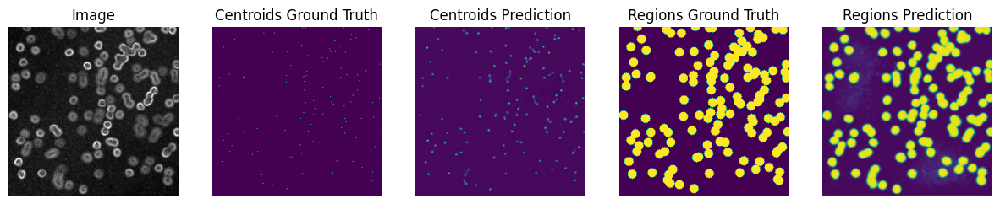

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_u_net/001_/
sample  0  saved


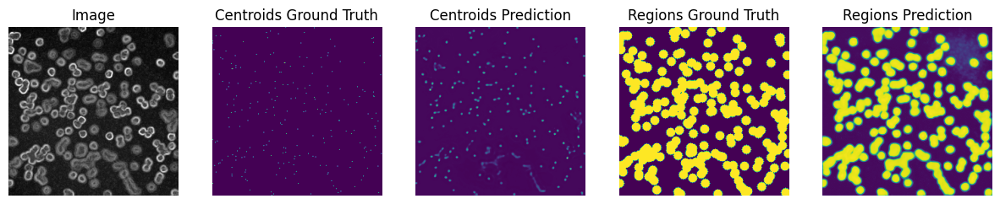

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_u_net/002_/
sample  1  saved


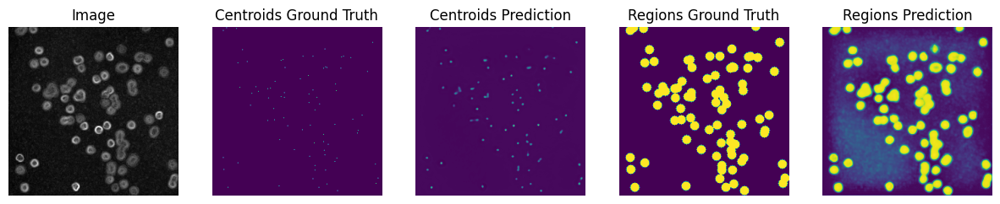

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_u_net/003_/
sample  2  saved


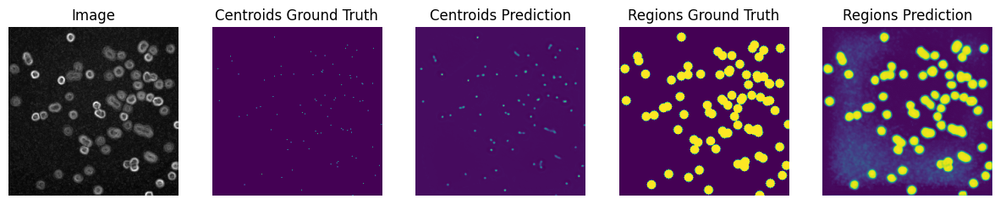

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_u_net/004_/
sample  3  saved


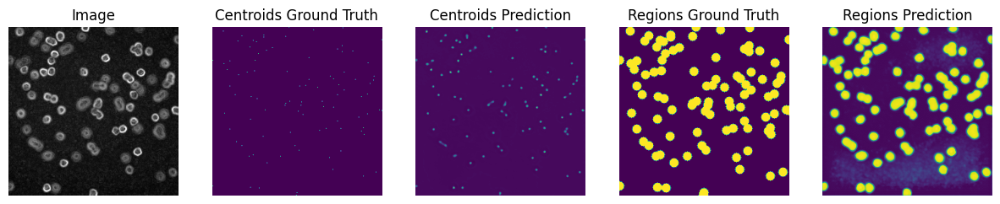

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_u_net/005_/
sample  4  saved


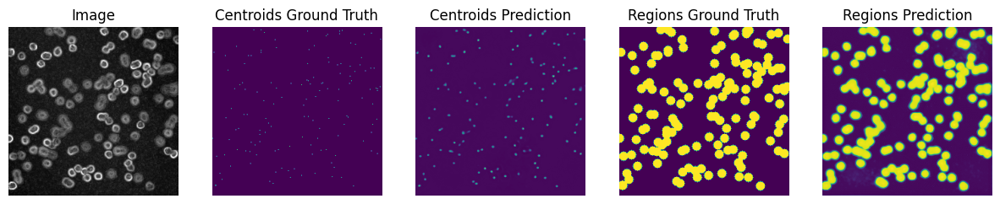

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_u_net/006_/
sample  5  saved


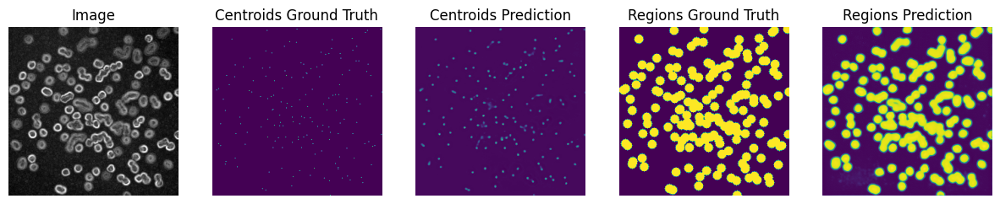

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_u_net/007_/
sample  6  saved


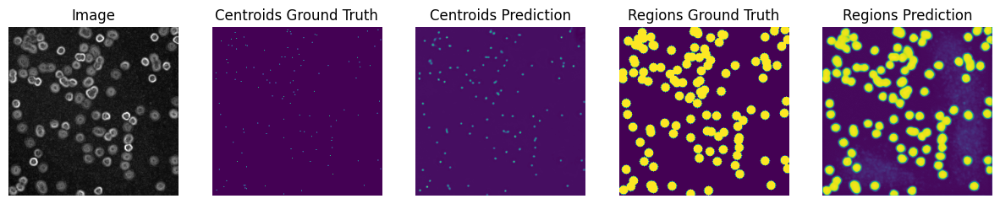

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_u_net/008_/
sample  7  saved


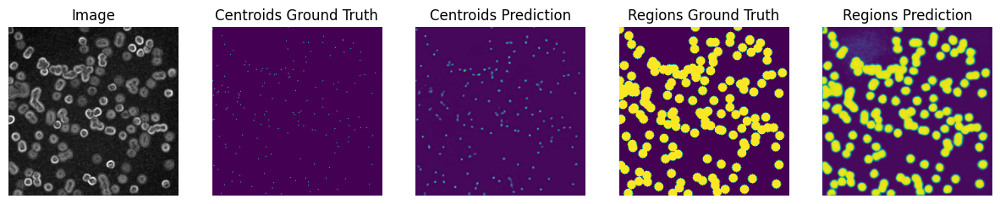

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_u_net/009_/
sample  8  saved


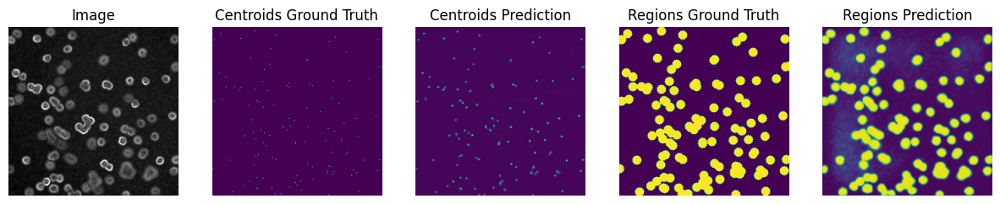

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_u_net/010_/
sample  9  saved


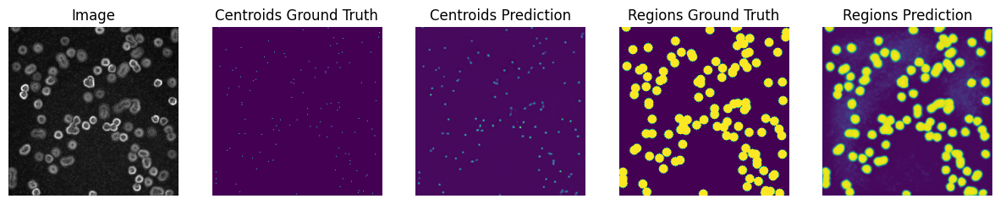

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_u_net/011_/
sample  10  saved


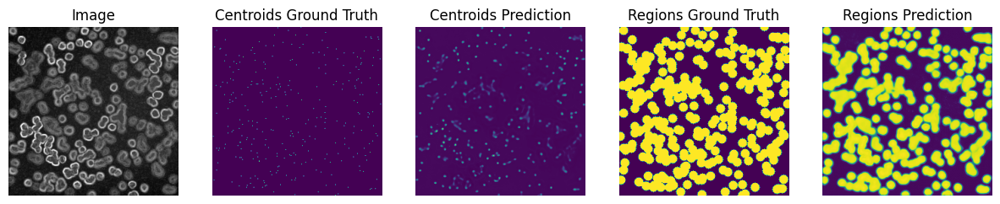

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_u_net/012_/
sample  11  saved


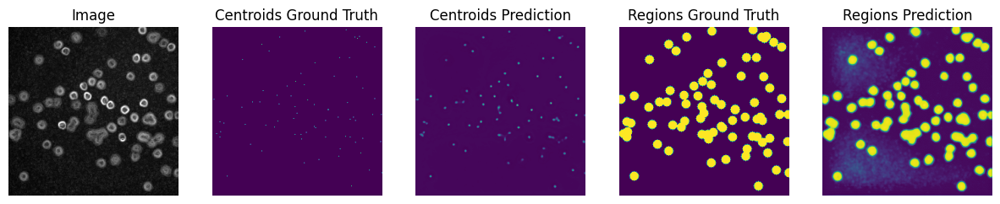

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_u_net/013_/
sample  12  saved


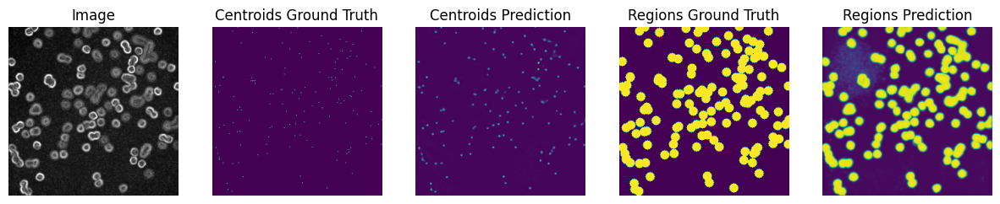

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_u_net/014_/
sample  13  saved


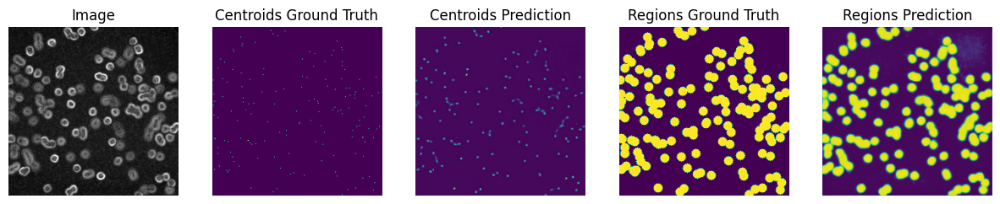

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_u_net/015_/
sample  14  saved


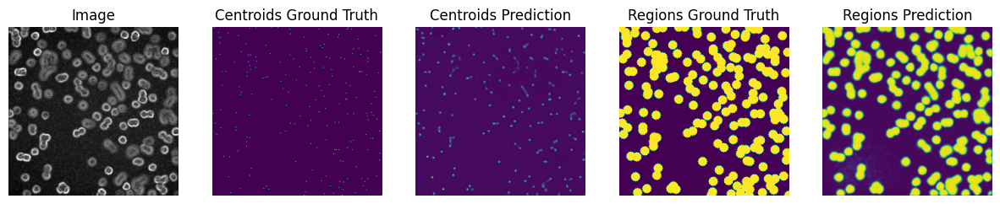

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_u_net/016_/
sample  15  saved


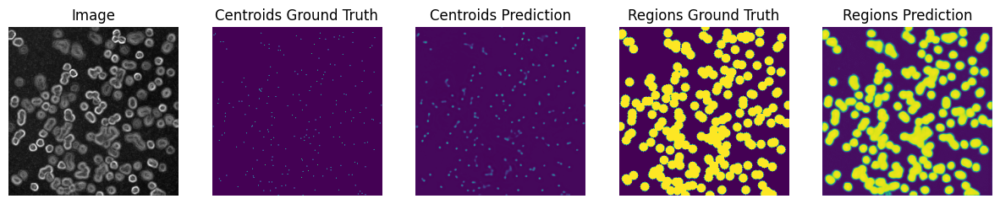

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_u_net/017_/
sample  16  saved


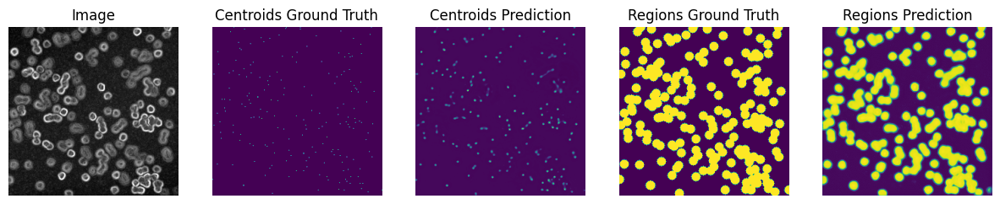

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_u_net/018_/
sample  17  saved


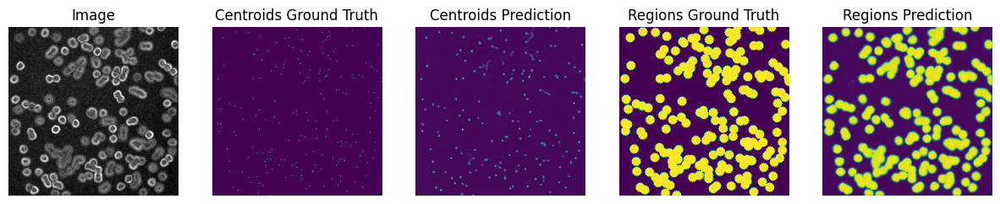

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_u_net/019_/
sample  18  saved


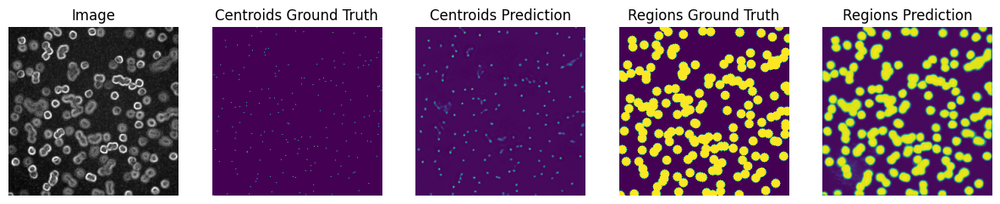

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_u_net/020_/
sample  19  saved


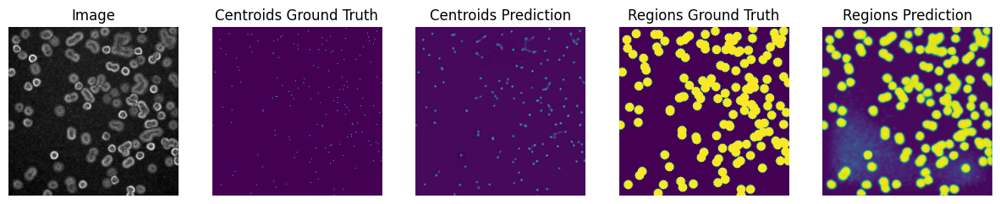

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_u_net/021_/
sample  20  saved


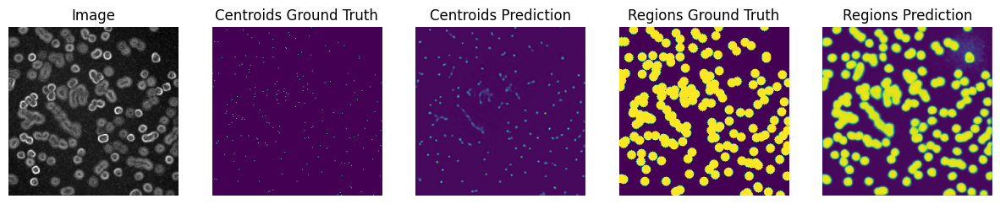

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_u_net/022_/
sample  21  saved


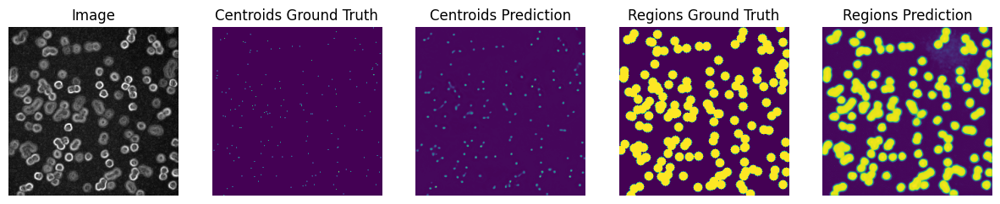

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_u_net/023_/
sample  22  saved


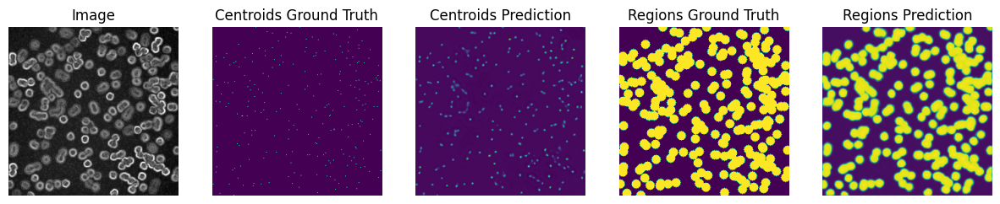

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_u_net/024_/
sample  23  saved


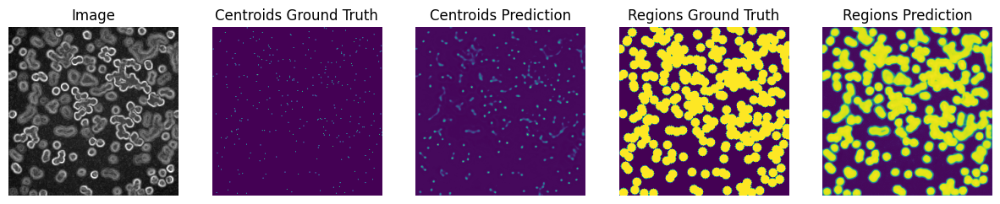

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_u_net/025_/
sample  24  saved


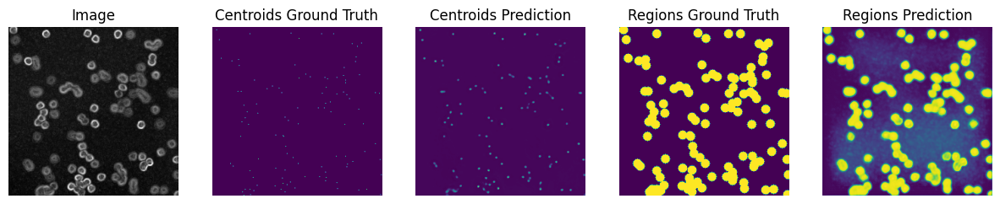

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_u_net/026_/
sample  25  saved


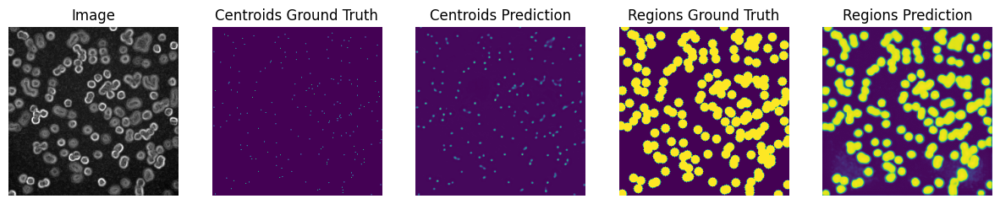

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_u_net/027_/
sample  26  saved


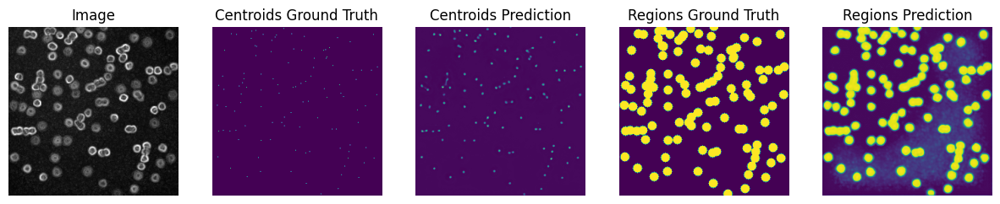

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_u_net/028_/
sample  27  saved


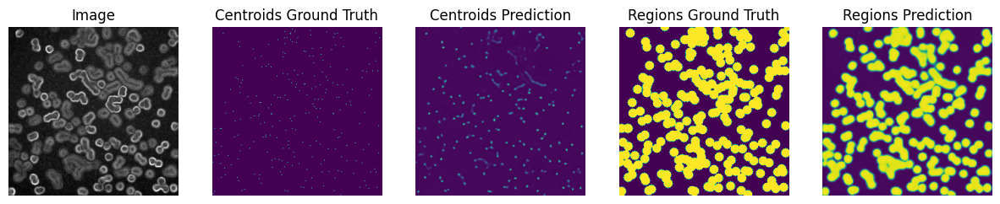

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_u_net/029_/
sample  28  saved


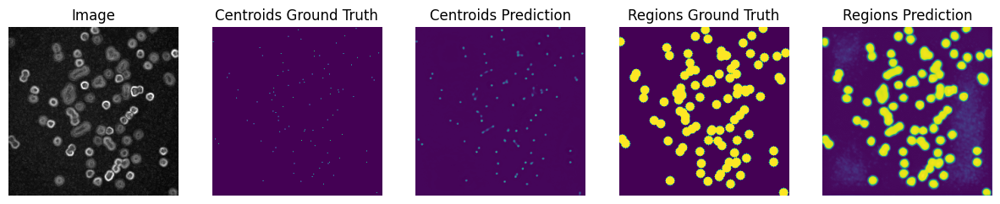

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_u_net/030_/
sample  29  saved


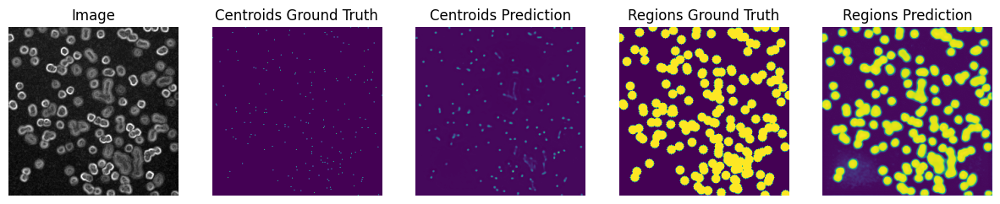

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_u_net/031_/
sample  30  saved


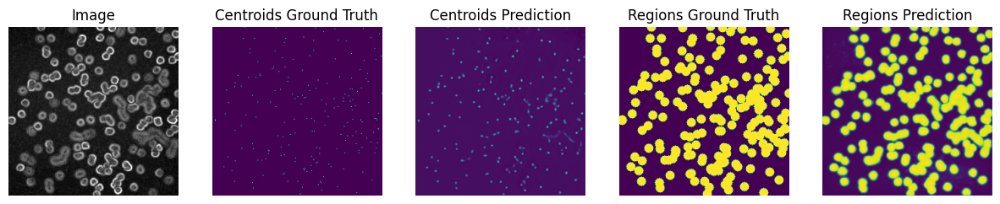

C:/Users/narges/PycharmProjects3/pythonProject3/IEEE_transaction_paper/synth_dataset/outputs_u_net/032_/
sample  31  saved


In [46]:
# model_regions = buildModel_U_net(input_dim = (256,256,3))
# model_center = buildModel_U_net(input_dim = (256,256,3))
# model_regions.load_weights('./checkpoints_yeast/own_net_regions_50.hdf5')
# model_center.load_weights('./checkpoints_yeast/own_net_center.hdf5')

A = model_regions.predict(data_)

B = model_center.predict(data_)



# data_r_anno_reshaped = np.transpose(r_anno, (0, 2, 3, 1))
# print(data_.shape , r_anno.shape , data_r_anno_reshaped.shape ,  A.shape)

folder_name= base_address+ '/synth_dataset/outputs_u_net/'
for i in range(data_.shape[0]):
    show_save_all_sample(data_[i] , B[i], anno_centroids[i] , A[i],anno_regions[i]  , folder_name , region_file_names[i] ,counts[i] )
    print("sample ", i , " saved")